# Vizualization jupyter for create all plots
- heat map:
    * single heatmap
    * all subsets in one plot
    * heatmap for base subset but with different split and scaffolds
    * heatmap showing values difference between baseline and other subsets
    * heatmap for all generators and receptors
    * heatmap for all generators and receptors: 3 different heatmaps per metric


In [301]:
from src import heatmap_visualization as hv

import importlib as imp
imp.reload(hv)

data_folder = '../'

# HEATMAPS

1. Define the type of cluster split:
    - 'dis' for Dissimilarity split
    - 'sim' for Similarity split
2. Define the type of scaffold:
    - 'csk' for CSK scaffold
    - 'murcko' for Murcko scaffold
3. Define the subset of data to visualize:
    - Examples: '_10k', '_100k', '_500k'
    - Use an empty string '' to represent the baseline subset
4. Define the list of generators you want to include in the heatmap
5. Define data_folder, where all you results saved
6. If you want to save the image to another folder, please define save_folder. If not, it will be saved to the img/ folder in the project root.

### Heatmap of single split

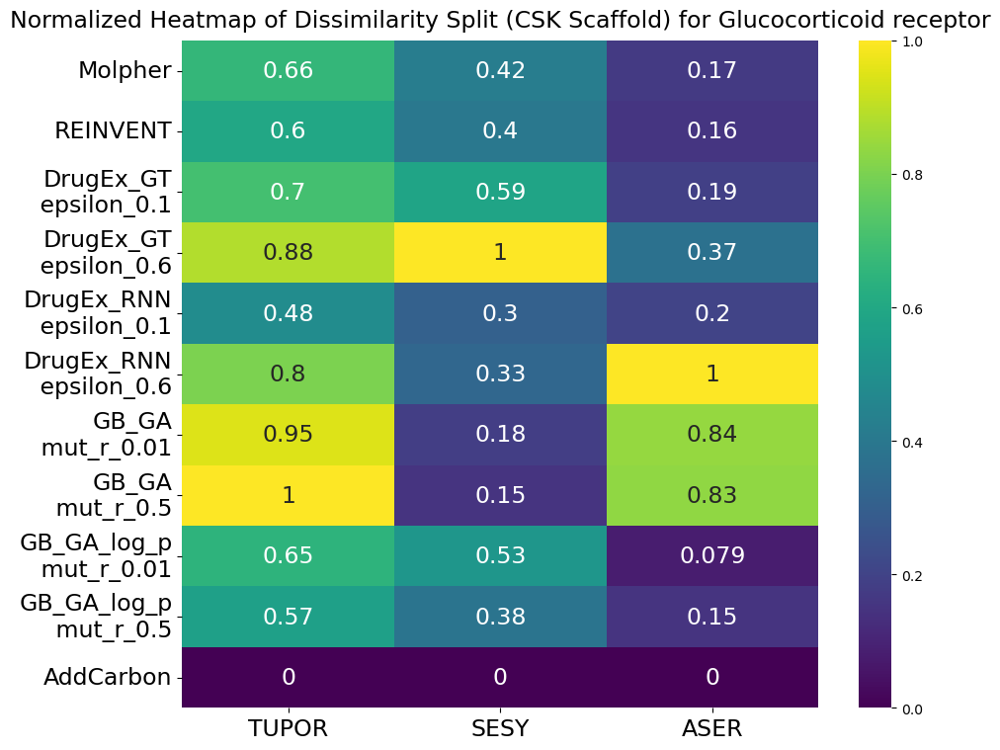

In [263]:
type_cluster = 'dis'
type_scaffold = 'csk'
subset = ''
generators_name_list = [
    f"Molpher{subset}",
    f"REINVENT{subset}",
    f"DrugEx_GT_epsilon_0.1{subset}",
    f"DrugEx_GT_epsilon_0.6{subset}",
    f"DrugEx_RNN_epsilon_0.1{subset}",
    f"DrugEx_RNN_epsilon_0.6{subset}",
    f"GB_GA_mut_r_0.01{subset}",
    f"GB_GA_mut_r_0.5{subset}",
    f"GB_GA_log_p_mut_r_0.01{subset}",
    f"GB_GA_log_p_mut_r_0.5{subset}",
    f"addcarbon{subset}"
]
receptor = 'Glucocorticoid_receptor'
            
if subset == '':
    subset = 'base'

#For poster we need a little different colors
poster = False

if poster == True:
    colors = ["#f4b285", "#aad1fd", "#b7d59e"] 
    cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)
    name_save = f'heatmap_{type_cluster}_{type_scaffold}{subset}_poster'
else:
    cmap = 'viridis'
    name_save = f'heatmap_{type_cluster}_{type_scaffold}{subset}'


if type_scaffold == 'csk':
    type_scaffold_str =  'CSK'
elif type_scaffold == 'murcko':
    type_scaffold_str = 'Murcko'
else:
    type_scaffold_str = type_scaff
if receptor == 'Glucocorticoid_receptor':
    receptor_str = 'Glucocorticoid receptor'
elif receptor == 'Leukocyte_elastase':
    receptor_str = 'Leukocyte elastase'
else:
    receptor_str = receptor
    
if type_cluster == 'dis':
    type_cluster_str = 'Dissimilarity'
elif type_cluster == 'sim':
    type_cluster_str = 'Similarity'
    
title = f'Normalized Heatmap of {type_cluster_str} Split ({type_scaffold_str} Scaffold) for {receptor_str}'
#title = f"Heatmap for {type_cluster} split and {type_scaffold_str} scaffold for {receptor_str}"
hv.plot_heatmap(type_cluster, type_scaffold, generators_name_list, receptor, title=title, cmap = cmap, name_save=name_save, using_norm_values = True, data_folder = data_folder, save_folder = f'../img/{receptor}')

### Heatmap of different subsets visualized in a single plot.

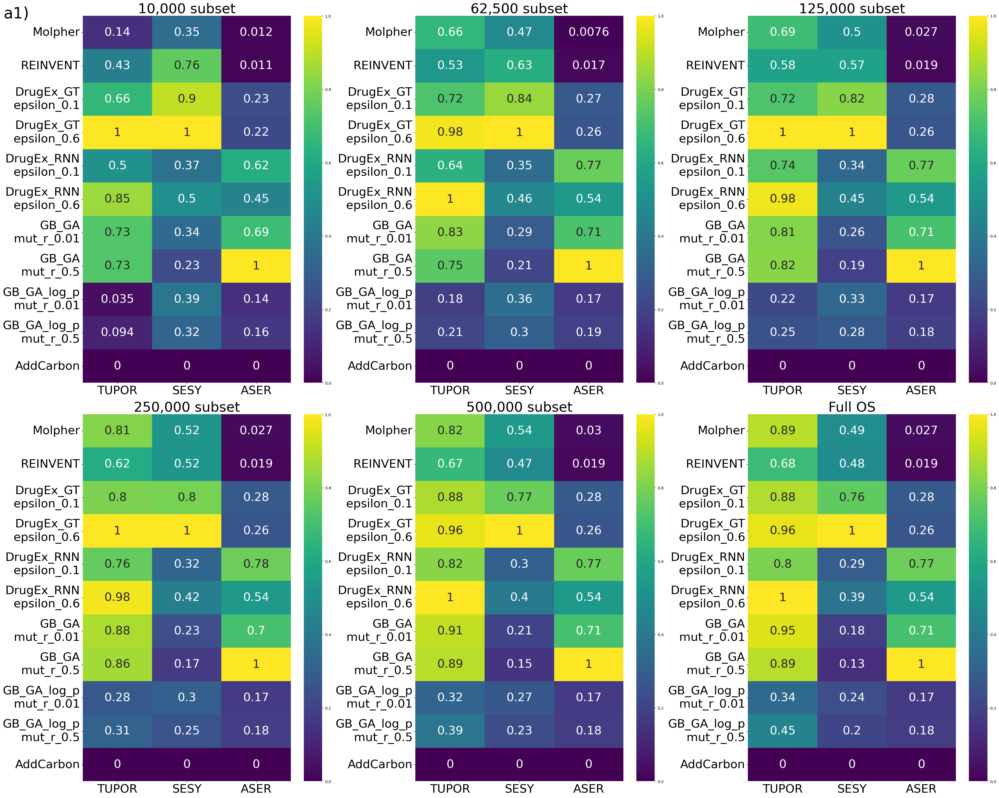

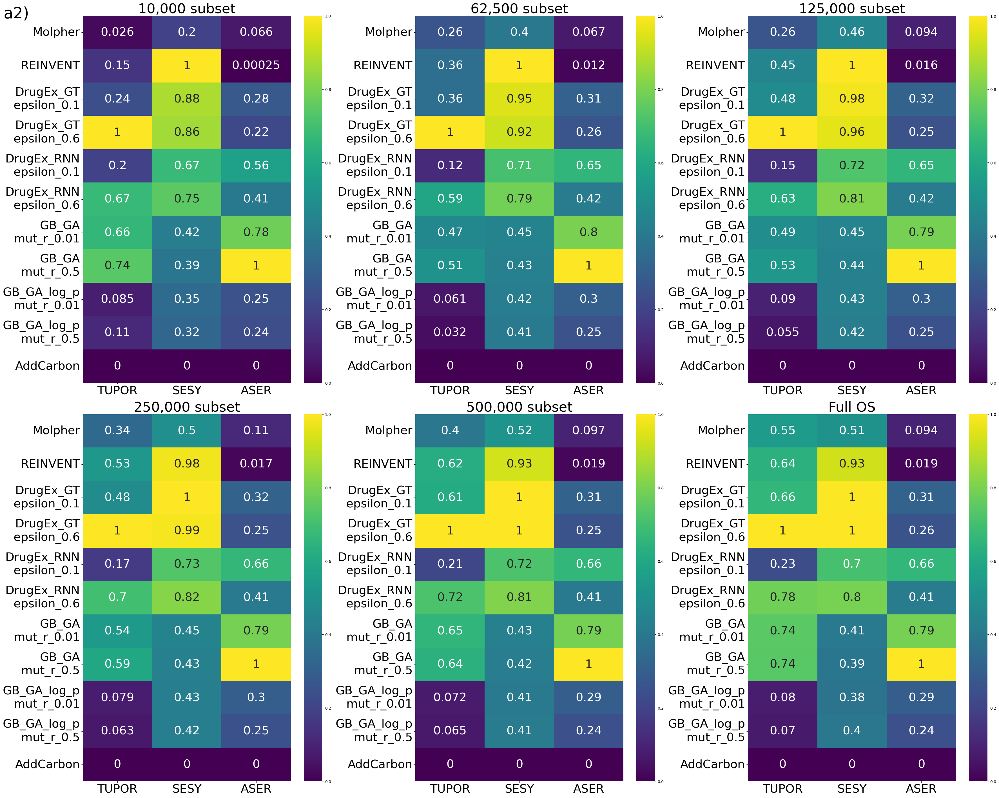

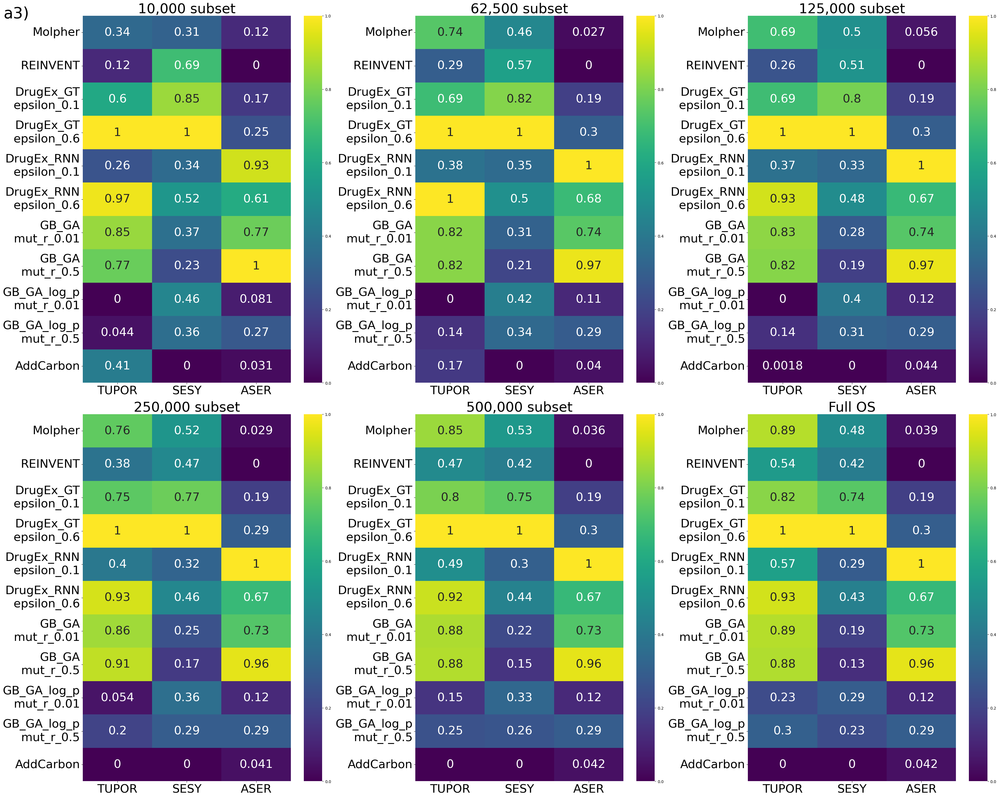

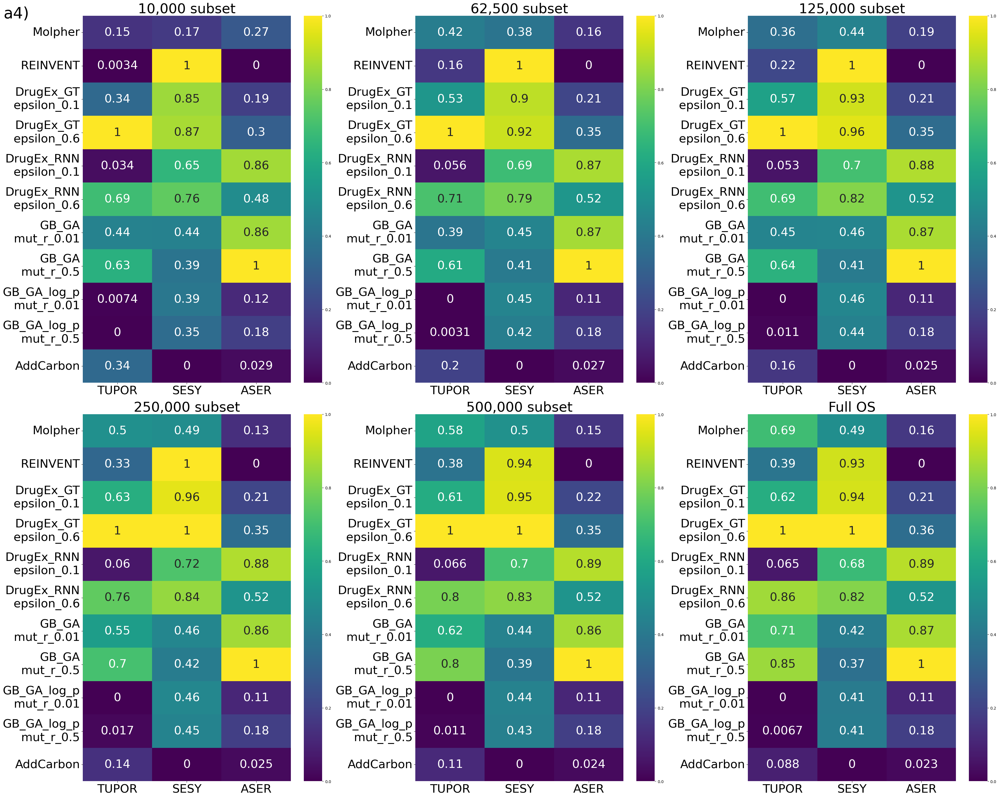

In [266]:
# Iterate through different types of splits (e.g., 'dis' and 'sim') and scaffold types (e.g., 'csk' and 'murcko')
count = 1
for type_cluster in ['dis', 'sim']:
    for type_scaffold in ['csk', 'murcko']:
        # Initialize an empty dictionary to store the data for each subset
        subset_dict = {}

        # Iterate through different subsets (base, 1k, 10k, 100k, 500k)
        for subset in ['_10k','_62.5k', '_125k', '_250k', '_500k', '']:
        #for subset in ['_10k', '']:
            receptor = 'Leukocyte_elastase'
            # Load the corresponding DataFrame from the CSV file based on the subset
            
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"GB_GA_log_p_mut_r_0.01{subset}",
                f"GB_GA_log_p_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]

            using_norm_value = True #Define if use normalized values or not

            if using_norm_value:
                df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor, data_folder)
            else:
                df = hv.preprocesing_org(type_cluster, type_scaffold, generators_name_list, receptor, data_folder)
            # Add the loaded data to the subset_dict with the subset name as the key
            subset_dict[subset] = df
        
        # Call the plot_all_subsets function to plot heatmaps for all subsets in the subset_dict
        name_save = f'6x1_heat_maps_{type_cluster}_{type_scaffold}_{receptor}_4'
        # The title for the heatmap figure is dynamically generated based on the scaffold type and split type

        if type_scaffold == 'csk':
            type_scaffold = 'CSK'

        num = f"a{count})"
        #num = ""
        
        #title=f'Heatmaps for {type_scaffold} scaffolds and {type_cluster} split for {receptor.replace("_", " ")}'
        hv.plot_all_subsets(subset_dict, receptor = receptor, name_save=name_save, numering = num, save_folder = f'../img/{receptor}')
        count += 1

### Heatmaps for Compared to Baseline Data for Different Split Types and Scaffold Combinations


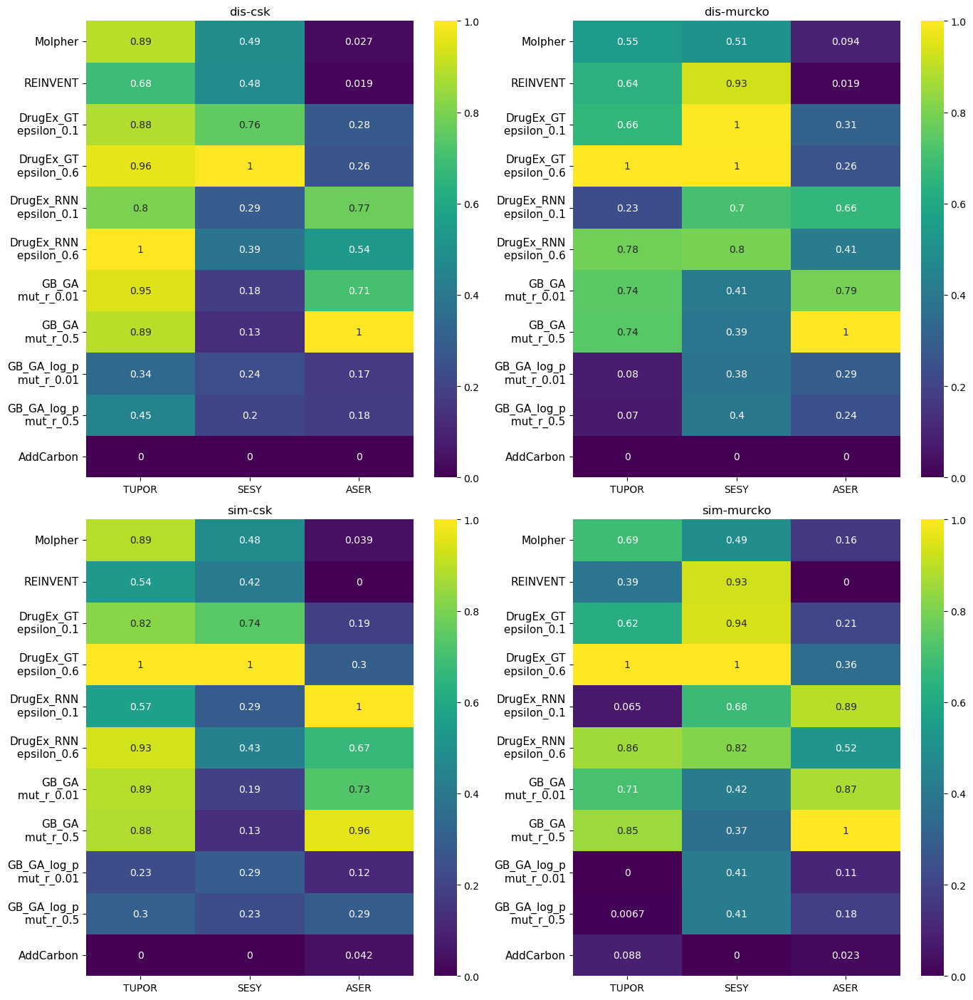

In [268]:
# Initialize empty dictionaries to store data and titles for each subset
subset_dict = {}
subset_dict_data = {}

# Iterate over the different types of splits ('dis', 'sim') and scaffold types ('csk', 'murcko')
for i, type_cluster in enumerate(['dis', 'sim']):
    for j, type_scaffold in enumerate(['csk', 'murcko']):
        receptor = 'Leukocyte_elastase'
        # Load the DataFrame for the 'base' subset from the corresponding CSV file
        # The file path is constructed dynamically based on the type_split and scaf
        generators_name_list = [
                f"Molpher",
                f"REINVENT",
                f"DrugEx_GT_epsilon_0.1",
                f"DrugEx_GT_epsilon_0.6",
                f"DrugEx_RNN_epsilon_0.1",
                f"DrugEx_RNN_epsilon_0.6",
                f"GB_GA_mut_r_0.01",
                f"GB_GA_mut_r_0.5",
                f"GB_GA_log_p_mut_r_0.01",
                f"GB_GA_log_p_mut_r_0.5",
                f"addcarbon"
            ]

        using_norm_value = True #Define if use normalized values or not

        if using_norm_value:
            df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor, data_folder)
        else:
            df = hv.preprocesing_org(type_cluster, type_scaffold, generators_name_list, receptor, data_folder)
        
        # Store the loaded DataFrame in the subset_dict with a key representing its position in the grid (i,j)
        subset_dict[f'{i},{j}'] = df
        
        # Store a descriptive title for the subset in subset_dict_data (e.g., 'dis-csk', 'sim-murcko')
        subset_dict_data[f'{i},{j}'] = f'{type_cluster}-{type_scaffold}'
#colors = ["#f4b285", "#aad1fd", "#b7d59e"] 
#cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

name_save = 'heat_map_comparison_base_all_splits_paper'
# Call the plot_heatmap_base function to plot the heatmaps for all subsets in the subset_dict
# The title 'Heatmaps' will be displayed for the overall figure
#f'Heatmaps for various split types nad scaffold combination for base subset for {receptor}'
hv.plot_heatmap_base(subset_dict, subset_dict_data, title = '', receptor = receptor, name_save = name_save, save_folder = f'../img/{receptor}')


### Heatmaps for Differences Between Baseline and Other Subsets

/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


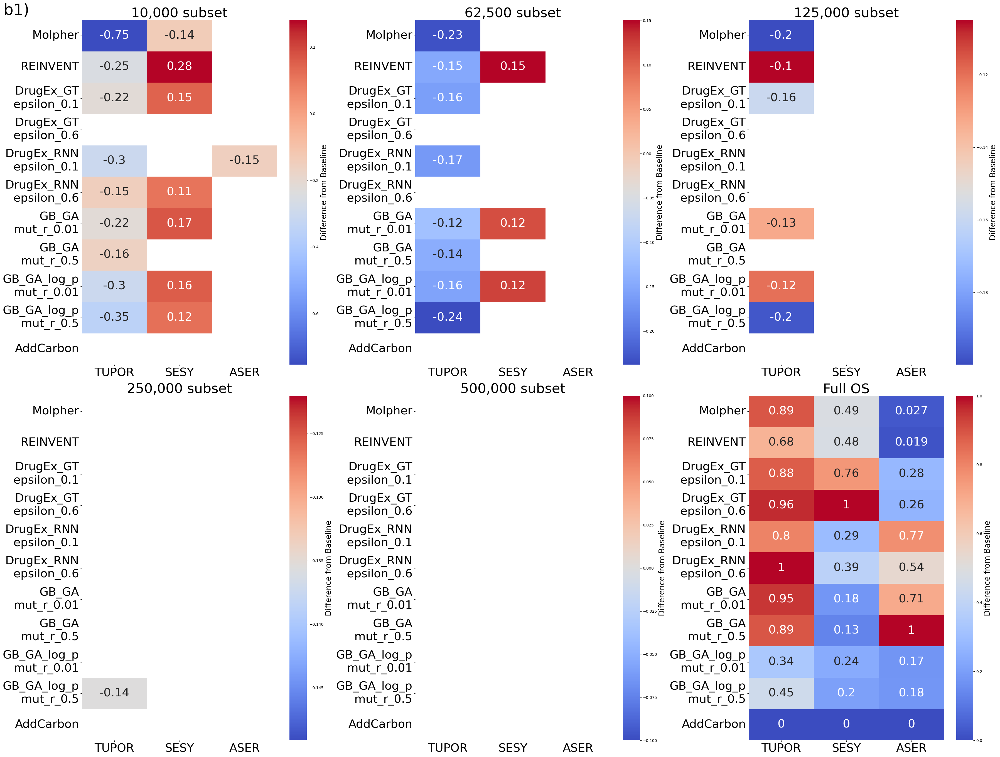

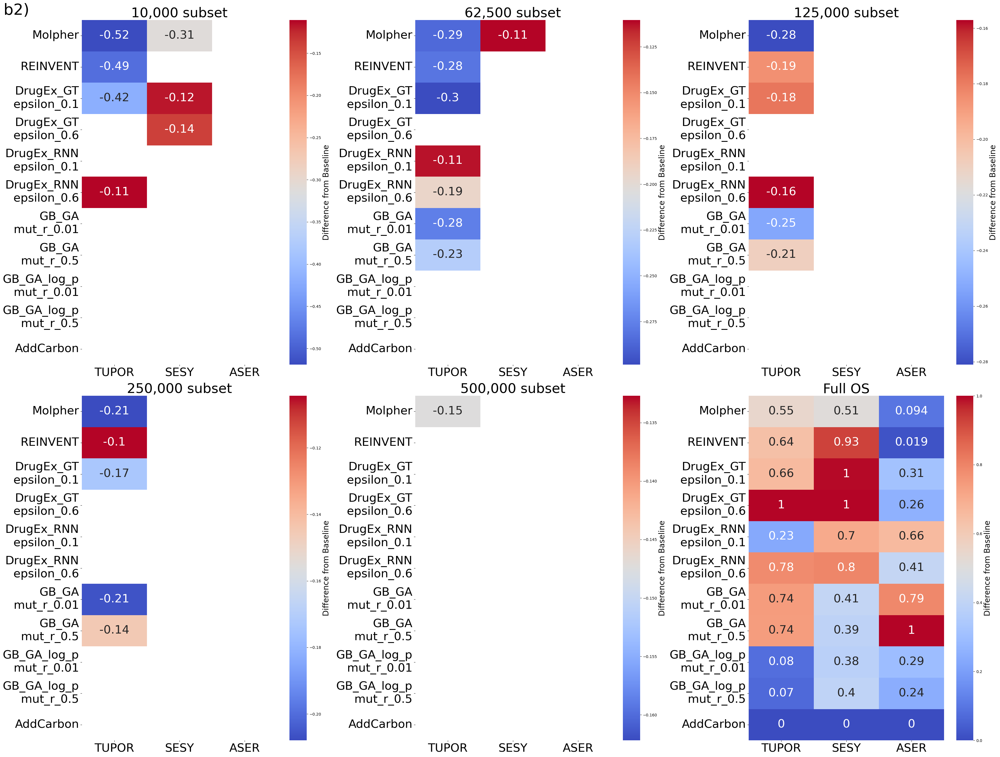

/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/home/filv/.conda/envs/recall_metrics_env/lib/python3.9/site-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


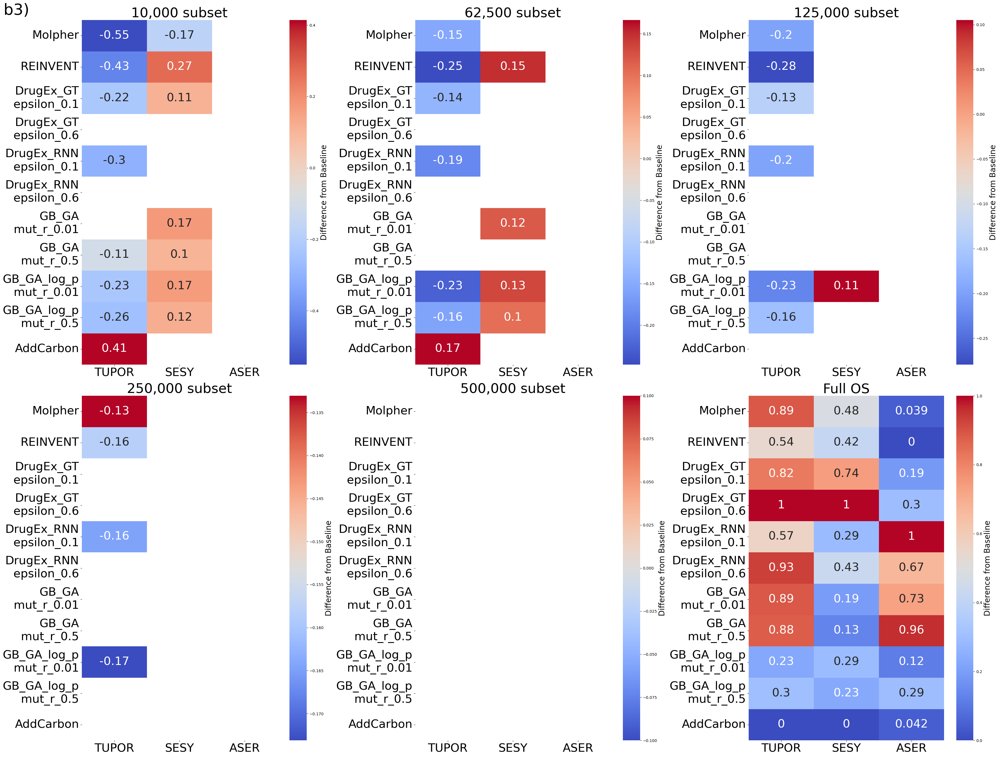

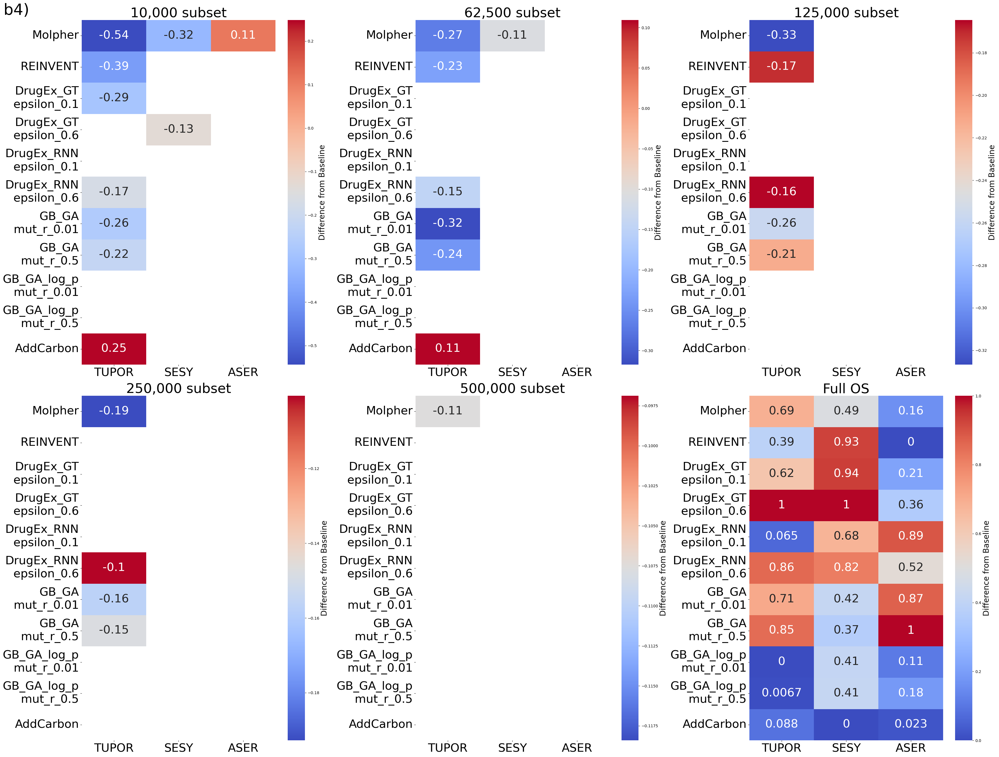

In [271]:
count = 1
for type_cluster in ['dis', 'sim']:
    for type_scaffold in ['csk', 'murcko']:
        data_dict = {}
        receptor = 'Leukocyte_elastase'
        # Load the baseline data (replace with your actual file paths)
        for subset in ['_10k','_62.5k', '_125k', '_250k', '_500k', '']:
        #for subset in ['_10k', '']:
            generators_name_list = [
                f"Molpher{subset}",
                f"REINVENT{subset}",
                f"DrugEx_GT_epsilon_0.1{subset}",
                f"DrugEx_GT_epsilon_0.6{subset}",
                f"DrugEx_RNN_epsilon_0.1{subset}",
                f"DrugEx_RNN_epsilon_0.6{subset}",
                f"GB_GA_mut_r_0.01{subset}",
                f"GB_GA_mut_r_0.5{subset}",
                f"GB_GA_log_p_mut_r_0.01{subset}",
                f"GB_GA_log_p_mut_r_0.5{subset}",
                f"addcarbon{subset}"
            ]
            
            using_norm_value = True #Define if use normalized values or not

            if using_norm_value:
                df = hv.preprocesing(type_cluster, type_scaffold, generators_name_list, receptor, data_folder)
            else:
                df = hv.preprocesing_org(type_cluster, type_scaffold, generators_name_list, receptor, data_folder)
            
            # Load the baseline data for the given split type and scaffold
            if subset == '': #baseline
                baseline_df = df
                
            
                
            data_dict[subset] = df
        numering = f"b{count})"
        #numering = ""
        
        name_save = f'7x1_heat_maps_{type_cluster}_{type_scaffold}_{receptor}_diff_4'
        # Call the function to plot heatmaps
        hv.plot_heatmaps_with_diff_from_baseline(baseline_df, data_dict, type_cluster, type_scaffold, receptor = receptor, name_save = name_save, numering = numering, save_folder = f'../img/{receptor}')
        count += 1

### Combined Heatmap for All Generators and Receptors

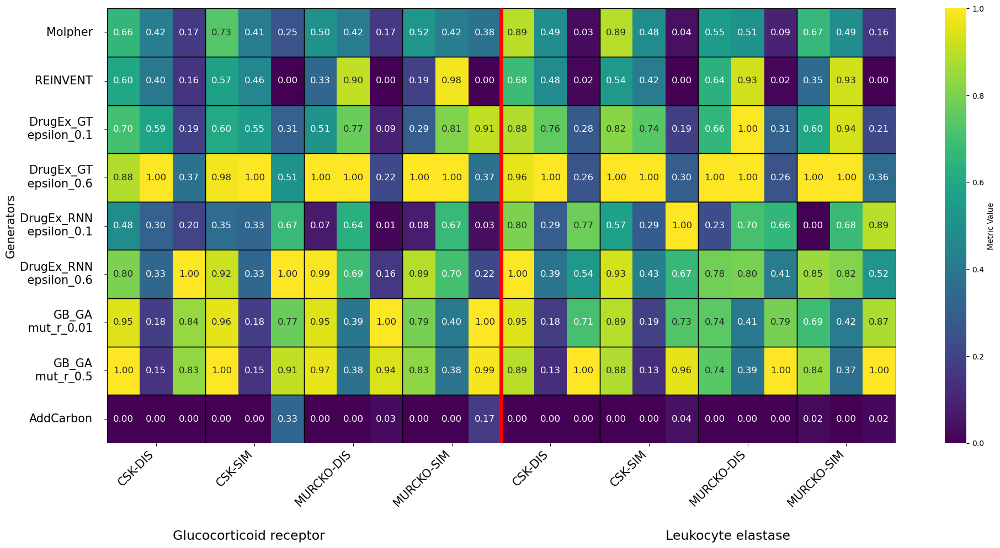

In [275]:
# All data what you want to represented in combined heatmap
generators = ['Molpher', 'REINVENT', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6', 'DrugEx_RNN_epsilon_0.1', 'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5', 'addcarbon']
receptors = ['Glucocorticoid_receptor', 'Leukocyte_elastase']
scaffolds = ['csk', 'murcko']
splits = ['dis', 'sim']
metrics = ['TUPOR', 'SESY', 'ASER']

#Img will save to img/heat_map folder
hv.plot_combined_heatmap(generators,receptors,scaffolds,splits,metrics,cmap="viridis", title="", save_name="all_res_norm",using_norm_values = True, data_folder = data_folder, save_folder = '../img/')

### Combined Heatmap for All Generators and Receptors: 3 Different Heatmaps per Metric

- Define which generators, receptors, and scaffold types you want to create heatmaps for.  
- You can choose to use normalized or non-normalized data; this is controlled by the `using_norm_values` parameter.  
- Function `plot_combined_heatmap_variable_cmaps` → Creates 3 separate heatmaps for each metric. Using normalized data is recommended.  
- Function `plot_combined_heatmap_with_single_column_for_each_metric` → Each column corresponds to a single heatmap, showing different gradient shifts. Using non-normalized data is recommended.  


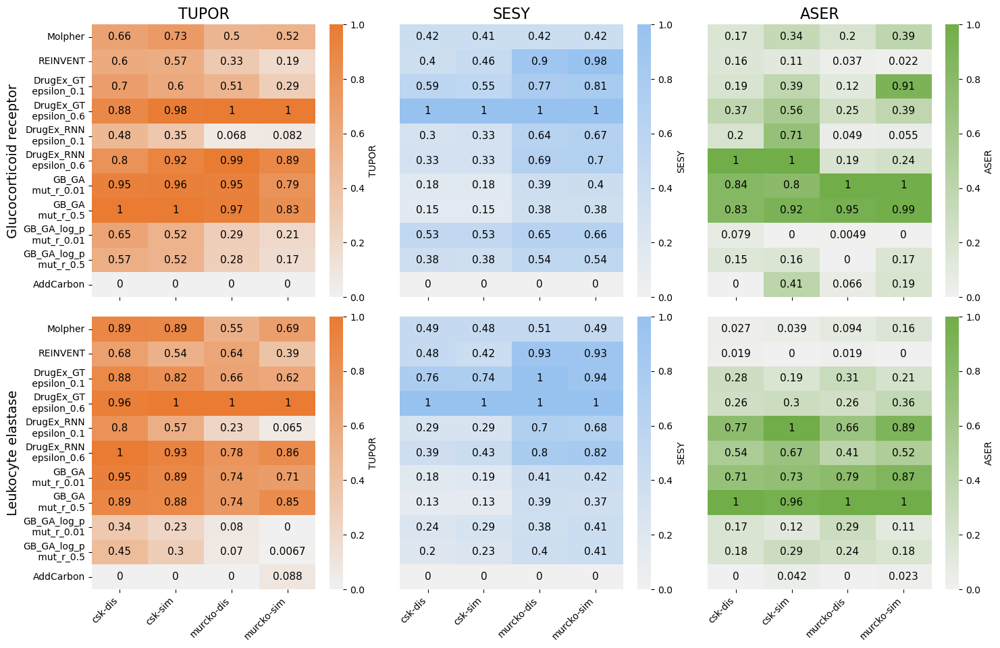

In [277]:
generators = ['Molpher', 'REINVENT', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6', 'DrugEx_RNN_epsilon_0.1',\
              'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5', 'GB_GA_log_p_mut_r_0.01', 'GB_GA_log_p_mut_r_0.5', 'addcarbon']
receptors = ['Glucocorticoid_receptor', 'Leukocyte_elastase']
scaffolds = ['csk', 'murcko']
splits = ['dis', 'sim']
metrics = ['TUPOR', 'SESY', 'ASER']

hv.plot_combined_heatmap_variable_cmaps(generators, receptors, scaffolds, splits, save_name="all_res_norm_dis_metrics",using_norm_values=True, data_folder=data_folder, save_folder = '../img/') 

/home/filv/phd_projects/iga_2023/git_reccal/new/recall_metrics/src/heatmap_visualization.py:845: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.savefig(f'img/heat_map/{save_name}.tiff', format="tiff", dpi=300, bbox_inches='tight')


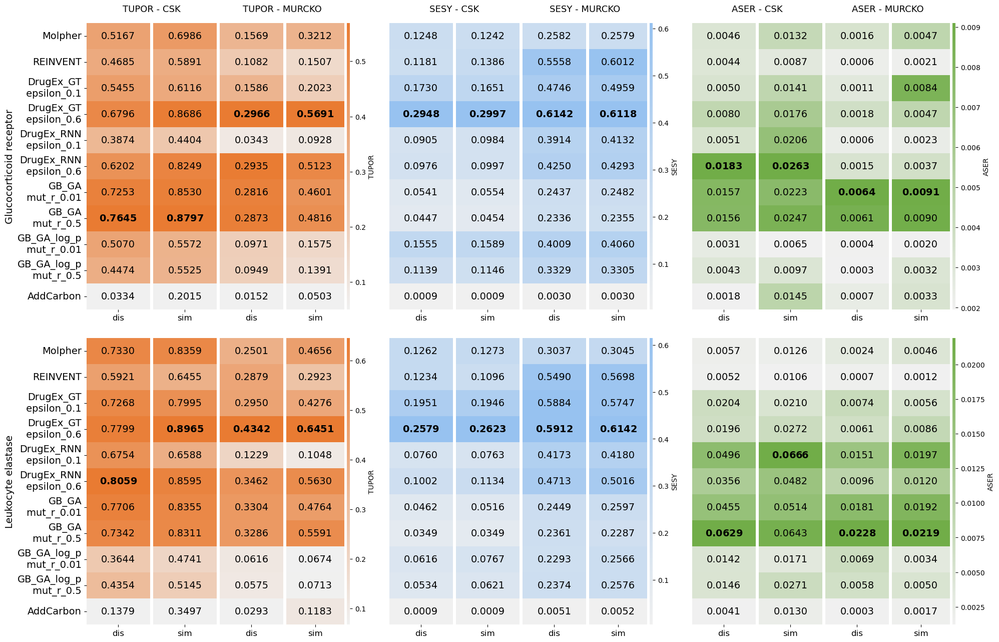

In [304]:
generators = ['Molpher', 'REINVENT', 'DrugEx_GT_epsilon_0.1', 'DrugEx_GT_epsilon_0.6', 'DrugEx_RNN_epsilon_0.1',\
              'DrugEx_RNN_epsilon_0.6', 'GB_GA_mut_r_0.01', 'GB_GA_mut_r_0.5', 'GB_GA_log_p_mut_r_0.01', 'GB_GA_log_p_mut_r_0.5', 'addcarbon' ]
receptors = ['Glucocorticoid_receptor', 'Leukocyte_elastase']
scaffolds = ['csk', 'murcko']
splits = ['dis', 'sim']
metrics = ['TUPOR', 'SESY', 'ASER']

hv.plot_combined_heatmap_with_single_column_for_each_metric(generators, receptors, scaffolds, splits, save_name="all_res_metrics_per_column_paper",using_norm_values=False, data_folder=data_folder, save_folder = 'img/heat_map') 

# New

In [77]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import LinearSegmentedColormap, to_rgb
from matplotlib.colors import ListedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import math
from matplotlib.gridspec import GridSpec

In [64]:
subsets = ['_10k','_62.5k', '_125k', '_250k', '_500k', '']

In [286]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_combined_heatmap_with_single_column_for_each_metric_2(
        generators, subsets, receptors, scaffolds, splits,
        metrics=['TUPOR', 'SESY', 'ASER'],
        title=None, save_name=None, using_norm_values=False, data_folder='', save_folder = '',
        inter_metric_wspace=0.15,   # spacing between metric columns
        intra_metric_wspace=0.05    # spacing between subset columns inside metric
    ):
    """
    Build a long-form dataframe by looking up preprocessed data using generator+subset names (e.g. Molpher_10k),
    but store results with Generator=Molpher and Subset=_10k. Then plot per-receptor figures with:
      - rows = combinations of (split, scaffold)
      - columns = metrics (TUPOR, SESY, ASER)
      - each metric cell contains N subset-columns (each subset = 1 column, rows = generators)
    """

    metric_base_colors = {
        'TUPOR': "#e97b32",
        'SESY':  "#97C2F0",
        'ASER':  "#71ad48"
    }


    data = []
    
    for sub in subsets:
        
        # verze názvů pro načítání (Molpher_10k)
        generators_new = [f"{gen}{sub}" for gen in generators]
    
        # verze názvů do dataframe (Molpher)
        # → to uložíme pod sloupec "Generator"
        generator_base_names = generators
        
        for gen in generators:
            for receptor in receptors:
                for type_scaffold in scaffolds:
                    for type_cluster in splits:
    
                        # načíst správně preprocess pomocí generators_new
                        df_raw = (
                            hv.preprocesing_org
                            if not using_norm_values
                            else hv.preprocesing
                        )(type_cluster, type_scaffold, generators_new, receptor, data_folder)
    
                        # extrahujeme hodnoty pro každý metrik
                        for met in metrics:
                            try:
                                # vyber správného řádku
                                value = df_raw[df_raw.name.str.startswith(gen)][met].iloc[0]
                            except:
                                value = None
    
                            data.append([
                                gen,            # čistý název generátoru (Molpher)
                                sub,      # už hezký subset (10k, 62k, Full OS)
                                receptor,
                                type_scaffold,
                                type_cluster,
                                met,
                                value
                            ])
    
    # vytvořit finální dataframe
    df_expanded = pd.DataFrame(
        data,
        columns=[
            'Generator',
            'Subset',
            'Receptor',
            'Scaffold',
            'Split',
            'Metric',
            'Value'
        ]
    )

    # Optional quick diagnostic — uncomment if you want to see if any combinations are missing
    # missing = df_expanded[df_expanded['Value'].isna()]
    # if not missing.empty:
    #     print("There are missing metric values for some combinations. Example rows:\n", missing.head())

    # ---------------------------------------------------------------------
    # 2) Plotting: one figure per receptor
    # ---------------------------------------------------------------------
    row_combinations = [(split, scaffold) for split in splits for scaffold in scaffolds]
    nrows = len(row_combinations)
    nmetrics = len(metrics)
    nsubsets = len(subsets)
    ngens = len(generators)
    split_label_map = {'dis': 'Dissimilarity', 'sim': 'Similarity'}
    def pretty_subset(s):
        if s in (None, ''):
            return "Full OS"
        return s.lstrip('_')
    for receptor in receptors:
        # figure sizing heuristics
        fig_width = max(12, 1.6 * nsubsets * nmetrics + 2)
        fig_height = max(4 + 0.25 * ngens * nrows, 6)
        fig = plt.figure(figsize=(fig_width*1.2, fig_height*1.5))
        outer_gs = fig.add_gridspec(nrows=nrows, ncols=nmetrics,
                                    wspace=inter_metric_wspace, hspace=0.15)

        for row_idx, (split, scaffold) in enumerate(row_combinations):
            for m_idx, metric in enumerate(metrics):
                # block for this receptor/split/scaffold/metric
                block = df_expanded[
                    (df_expanded['Receptor'] == receptor) &
                    (df_expanded['Split'] == split) &
                    (df_expanded['Scaffold'] == scaffold) &
                    (df_expanded['Metric'] == metric)
                ].copy()

                cmap_custom = hv.make_cmap_to_white(metric_base_colors.get(metric, "#CCCCCC"))

                # inner grid: columns = subsets
                inner = outer_gs[row_idx, m_idx].subgridspec(nrows=1, ncols=nsubsets,
                                                             wspace=intra_metric_wspace, hspace=0.0)
                for s_idx, subset in enumerate(subsets):
                    ax = fig.add_subplot(inner[0, s_idx])

                    # select rows for this subset and reindex by original generator names
                    sub_block = block[block['Subset'] == subset].set_index('Generator').reindex(generators)

                    # get heat values (generators × 1)
                    heat_vals = sub_block['Value'].to_numpy().reshape(len(generators), 1)

                    # vmin/vmax per subplot (change to global per metric if you prefer)
                    valid_mask = ~np.isnan(heat_vals.flatten())
                    if valid_mask.any():
                        vmin = np.nanmin(heat_vals)
                        vmax = np.nanmax(heat_vals)
                    else:
                        vmin, vmax = 0.0, 1.0

                    # compute bolding index (ignore NaNs)
                    flat = heat_vals.flatten()
                    flat_valid_idx = np.where(~np.isnan(flat))[0]
                    max_idx = int(flat_valid_idx[np.argmax(flat[flat_valid_idx])]) if flat_valid_idx.size > 0 else None

                    # build annotation (bold max)
                    annot = []
                    for i, val in enumerate(flat):
                        if np.isnan(val):
                            annot.append("")
                        else:
                            txt = f"{val:.4f}" if not using_norm_values else f"{val:.3f}"
                            if max_idx is not None and i == max_idx:
                                txt = r"$\bf{" + txt + "}$"
                            annot.append(txt)
                    annot = np.array(annot).reshape(heat_vals.shape)

                    # colorbar only on last subset column
                    show_colorbar = (s_idx == nsubsets - 1)
                    cax = None
                    if show_colorbar:
                        divider = make_axes_locatable(ax)
                        cax = divider.append_axes("right", size="4%", pad=0.04)

                    sns.heatmap(
                        heat_vals,
                        ax=ax,
                        annot=annot,
                        fmt="",
                        cmap=cmap_custom,
                        cbar=show_colorbar,
                        cbar_ax=cax,
                        cbar_kws={'label': metric} if show_colorbar else None,
                        annot_kws={"size": 14, "color": "black"},
                        vmin=vmin, vmax=vmax,
                        linewidths=0.5, linecolor='lightgrey'
                    )

                    # x-axis label = subset string
                    ax.set_xticks([0.5])
                    ax.set_xticklabels([pretty_subset(subset)], rotation=0, fontsize=11)

                    # y-axis: show generators only on the leftmost metric & subset
                    show_yticks = (m_idx == 0 and s_idx == 0)
                    if show_yticks:
                        ax.set_yticks(np.arange(len(generators)) + 0.5)
                        new_labels = [g.replace('_epsilon', '\n epsilon')
                                      .replace('_mut_r', '\n mut_r')
                                      .replace('addcarbon', 'AddCarbon')
                                      for g in generators]
                        ax.set_yticklabels(new_labels, rotation=0, fontsize=12)
                        ax.tick_params(axis='y', pad=8)
                        ax.set_ylabel(f"{split_label_map[split]}", fontsize=15, rotation=90, labelpad=40)
                    else:
                        ax.set_yticks([])
                        ax.set_yticklabels([])
                        ax.set_ylabel("")

                # add metric title on first row
                if row_idx == 0:
                    pos = outer_gs[row_idx, m_idx].get_position(fig)
                    fig.text((pos.x0 + pos.x1) / 2, pos.y1 + 0.01, metric, ha='center', va='bottom', fontsize=15)

        # global title
        if title:
            fig.suptitle(f"{title} — receptor: {receptor}", fontsize=14, y=0.995)

        plt.tight_layout(rect=[0, 0, 1, 0.97])

        if save_name:
            if save_folder:
                plt.savefig(f'{save_folder}/{receptor}/{save_name}.svg', format="svg", bbox_inches='tight')
                plt.savefig(f'{save_folder}/{receptor}/{save_name}.png', format="png",dpi=300, bbox_inches='tight')
                plt.savefig(f'{save_folder}/{receptor}/{save_name}.png', format="tiff",dpi=300, bbox_inches='tight')
            else:
                plt.savefig(f'img/heat_map/{save_name}.svg', format="svg", bbox_inches='tight')
                plt.savefig(f'img/heat_map/{save_name}.png', format="png", dpi=300, bbox_inches='tight')
                plt.savefig(f'img/heat_map/{save_name}.tiff', format="tiff", dpi=300, bbox_inches='tight')
    
        plt.show()


/var/tmp/pbs.142385.lich-compute.vscht.cz/ipykernel_14035/3358221932.py:209: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97])


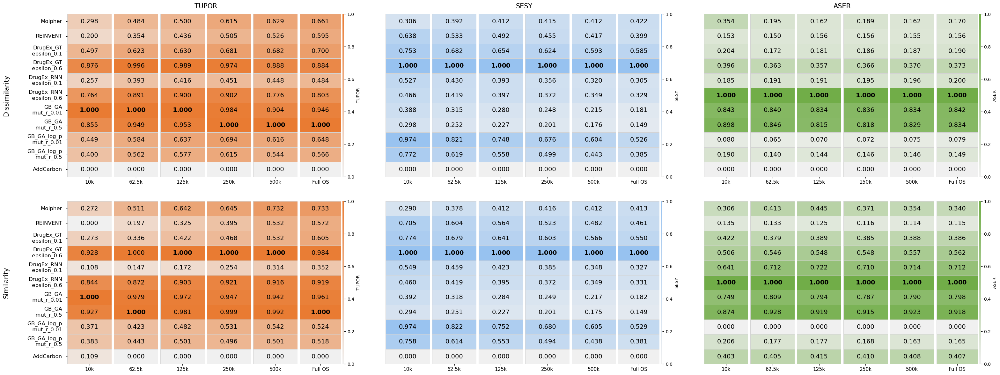

/var/tmp/pbs.142385.lich-compute.vscht.cz/ipykernel_14035/3358221932.py:209: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97])


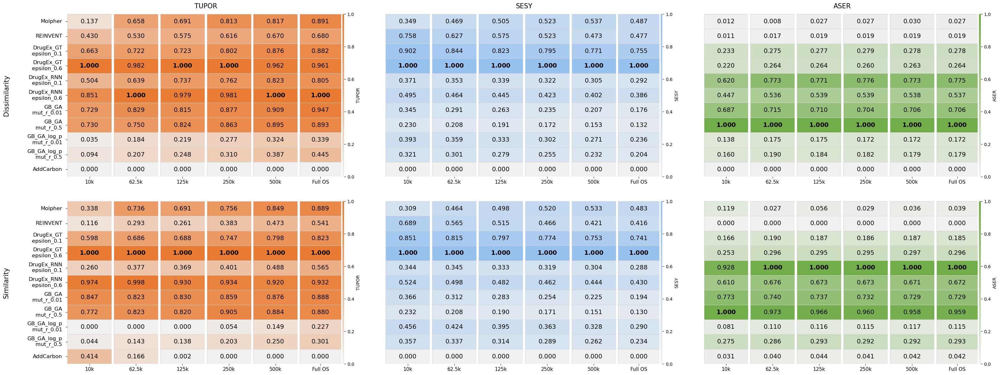

In [287]:
scaffold = ['csk']
plot_combined_heatmap_with_single_column_for_each_metric_2(generators, subsets, receptors, scaffold, splits, save_name="all_subclass_per_column",using_norm_values=True, data_folder=data_folder, save_folder = '../img') 

In [288]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_heatmaps_diff_from_baseline_full(
        generators, subsets, receptors, scaffolds, splits,
        metrics=['TUPOR', 'SESY', 'ASER'],
        title=None, save_name=None, using_norm_values=False, data_folder='', save_folder = '',
        inter_metric_wspace=0.15, intra_metric_wspace=0.05
    ):
    """
    Build a long-form dataframe by looking up preprocessed data using generator+subset names (e.g., Molpher_10k),
    store results with Generator=Molpher and Subset=10k/Full OS, compute difference vs. baseline subset (Full OS),
    then plot per-receptor figures:
      - rows = combinations of (split, scaffold)
      - columns = metrics (TUPOR, SESY, ASER)
      - each metric cell contains N subset-columns (each subset = 1 column, rows = generators)
    """

    metric_base_colors = {
        'TUPOR': "#e97b32",
        'SESY':  "#97C2F0",
        'ASER':  "#71ad48"
    }

    # --- 1) Build DataFrame with all values ---
    data = []
    baseline_values = {}  # key = (generator, receptor, scaffold, split, metric)

    baseline_sub = ""  # key = (gen, receptor, scaffold, split, metric)

    if "" in subsets:
        baseline_sub = ""  # Full OS
        generators_new = [f"{gen}{baseline_sub}" for gen in generators]
    
        for gen in generators:
            for receptor in receptors:
                for scaffold in scaffolds:
                    for split in splits:
                        df_raw = hv.preprocesing(split, scaffold, generators_new, receptor, data_folder)
                        for metric in metrics:
                            try:
                                value = df_raw[df_raw.name.str.startswith(gen)][metric].iloc[0]
                            except:
                                value = np.nan
                            baseline_values[(gen, receptor, scaffold, split, metric)] = value

    for sub in subsets:
        generators_new = [f"{gen}{sub}" for gen in generators]

        for gen in generators:
            for receptor in receptors:
                for scaffold in scaffolds:
                    for split in splits:
                        # load preprocessed data
                        df_raw = (hv.preprocesing_org if not using_norm_values else hv.preprocesing)(
                            split, scaffold, generators_new, receptor, data_folder
                        )

                        for metric in metrics:
                            try:
                                value = df_raw[df_raw.name.str.startswith(gen)][metric].iloc[0]
                            except:
                                value = np.nan
                            
                            # store baseline (subset == "")
                            if sub == "":
                                diff = value
                            else:
                                diff = value - baseline_values.get((gen, receptor, scaffold, split, metric), np.nan)
                                if abs(diff) < 0.1:
                                    diff = 0

                            data.append([
                                gen,                # Generator
                                sub, # Subset (10k, 125k, Full OS)
                                receptor,
                                scaffold,
                                split,
                                metric,
                                diff
                            ])

    df_expanded = pd.DataFrame(
        data, columns=['Generator', 'Subset', 'Receptor', 'Scaffold', 'Split', 'Metric', 'Value']
    )

        # --- 2) Plotting per receptor ---
    row_combinations = [(split, scaffold) for split in splits for scaffold in scaffolds]
    nrows = len(row_combinations)
    nmetrics = len(metrics)
    nsubsets = len(subsets)
    ngens = len(generators)
    split_label_map = {'dis': 'Dissimilarity', 'sim': 'Similarity'}
    def pretty_subset(s):
        if s in (None, ''):
            return "Full OS"
        return s.lstrip('_')
    for receptor in receptors:
        # figure sizing heuristics
        fig_width = max(12, 1.6 * nsubsets * nmetrics + 2)
        fig_height = max(4 + 0.25 * ngens * nrows, 6)
        fig = plt.figure(figsize=(fig_width*1.2, fig_height*1.5))
        outer_gs = fig.add_gridspec(nrows=nrows, ncols=nmetrics,
                                    wspace=inter_metric_wspace, hspace=0.15)

        for row_idx, (split, scaffold) in enumerate(row_combinations):
            for m_idx, metric in enumerate(metrics):
                # block for this receptor/split/scaffold/metric
                block = df_expanded[
                    (df_expanded['Receptor'] == receptor) &
                    (df_expanded['Split'] == split) &
                    (df_expanded['Scaffold'] == scaffold) &
                    (df_expanded['Metric'] == metric)
                ].copy()

                cmap_custom = hv.make_cmap_to_white(metric_base_colors.get(metric, "#CCCCCC"))

                # inner grid: columns = subsets
                inner = outer_gs[row_idx, m_idx].subgridspec(nrows=1, ncols=nsubsets,
                                                             wspace=intra_metric_wspace, hspace=0.0)
                for s_idx, subset in enumerate(subsets):
                    ax = fig.add_subplot(inner[0, s_idx])

                    # select rows for this subset and reindex by original generator names
                    sub_block = block[block['Subset'] == subset].set_index('Generator').reindex(generators)

                    # get heat values (generators × 1)
                    heat_vals = sub_block['Value'].to_numpy().reshape(len(generators), 1)

                    # vmin/vmax per subplot (change to global per metric if you prefer)
                    valid_mask = ~np.isnan(heat_vals.flatten())
                    if valid_mask.any():
                        vmin = np.nanmin(heat_vals)
                        vmax = np.nanmax(heat_vals)
                    else:
                        vmin, vmax = 0.0, 1.0

                    # compute bolding index (ignore NaNs)
                    flat = heat_vals.flatten()
                    flat_valid_idx = np.where(~np.isnan(flat))[0]
                    max_idx = int(flat_valid_idx[np.argmax(flat[flat_valid_idx])]) if flat_valid_idx.size > 0 else None

                    # build annotation (bold max)
                    annot = []
                    for i, val in enumerate(flat):
                        if np.isnan(val):
                            annot.append("")
                        else:
                            txt = f"{val:.2f}"
                            if max_idx is not None and i == max_idx and subset == "":
                                txt = r"$\bf{" + txt + "}$"
                            annot.append(txt)
                    annot = np.array(annot).reshape(heat_vals.shape)

                    # colorbar only on last subset column
                    show_colorbar = (s_idx == nsubsets - 1)
                    cax = None
                    if show_colorbar:
                        divider = make_axes_locatable(ax)
                        cax = divider.append_axes("right", size="4%", pad=0.04)

                    if subset != "":
                        mask = (heat_vals == 0) | np.isnan(heat_vals)
                    else:
                        mask = np.isnan(heat_vals)

                    # připrav annotace: jen nenulové hodnoty
                    annot = np.where(mask, "", np.round(heat_vals, 4))
                    
                    sns.heatmap(
                        heat_vals,
                        ax=ax,
                        annot=annot,
                        fmt="",
                        cmap=cmap_custom,
                        mask=mask,  # <-- maskuje nuly
                        cbar=show_colorbar,
                        cbar_ax=cax,
                        cbar_kws={'label': metric} if show_colorbar else None,
                        annot_kws={"size": 14, "color": "black"},
                        vmin=vmin, vmax=vmax,
                        linewidths=0.5, linecolor='lightgrey'
                    )

                    # x-axis label = subset string
                    ax.set_xticks([0.5])
                    ax.set_xticklabels([pretty_subset(subset)], rotation=0, fontsize=11)

                    # y-axis: show generators only on the leftmost metric & subset
                    show_yticks = (m_idx == 0 and s_idx == 0)
                    if show_yticks:
                        ax.set_yticks(np.arange(len(generators)) + 0.5)
                        new_labels = [g.replace('_epsilon', '\n epsilon')
                                      .replace('_mut_r', '\n mut_r')
                                      .replace('addcarbon', 'AddCarbon')
                                      for g in generators]
                        ax.set_yticklabels(new_labels, rotation=0, fontsize=12)
                        ax.tick_params(axis='y', pad=8)
                        ax.set_ylabel(f"{split_label_map[split]}", fontsize=15, rotation=90, labelpad=40)
                    else:
                        ax.set_yticks([])
                        ax.set_yticklabels([])
                        ax.set_ylabel("")

                # add metric title on first row
                if row_idx == 0:
                    pos = outer_gs[row_idx, m_idx].get_position(fig)
                    fig.text((pos.x0 + pos.x1) / 2, pos.y1 + 0.01, metric, ha='center', va='bottom', fontsize=15)

        # global title
        if title:
            fig.suptitle(f"{title} — receptor: {receptor}", fontsize=14, y=0.995)

        plt.tight_layout(rect=[0, 0, 1, 0.97])

        if save_name:
            if save_folder:
                plt.savefig(f'{save_folder}/{receptor}/{save_name}.svg', format="svg", bbox_inches='tight')
                plt.savefig(f'{save_folder}/{receptor}/{save_name}.png', format="png",dpi=300, bbox_inches='tight')
                plt.savefig(f'{save_folder}/{receptor}/{save_name}.png', format="tiff",dpi=300, bbox_inches='tight')
            else:
                plt.savefig(f'img/heat_map/{save_name}.svg', format="svg", bbox_inches='tight')
                plt.savefig(f'img/heat_map/{save_name}.png', format="png", dpi=300, bbox_inches='tight')
                plt.savefig(f'img/heat_map/{save_name}.tiff', format="tiff", dpi=300, bbox_inches='tight')


        plt.show()

/var/tmp/pbs.142385.lich-compute.vscht.cz/ipykernel_14035/1271239659.py:217: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97])


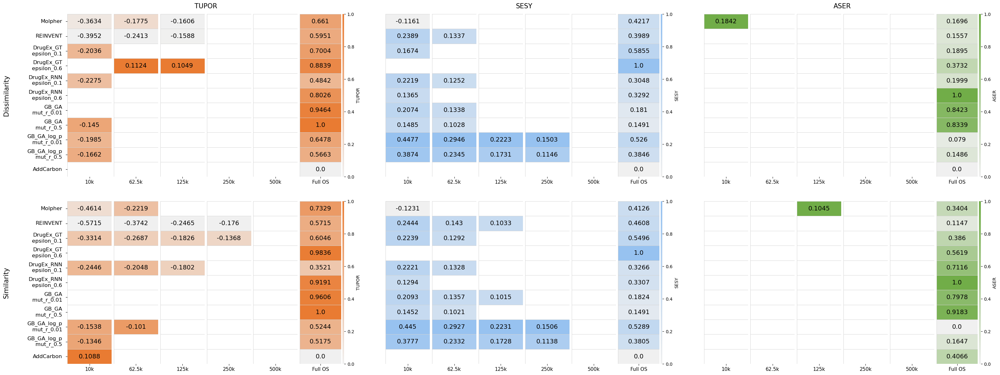

/var/tmp/pbs.142385.lich-compute.vscht.cz/ipykernel_14035/1271239659.py:217: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.97])


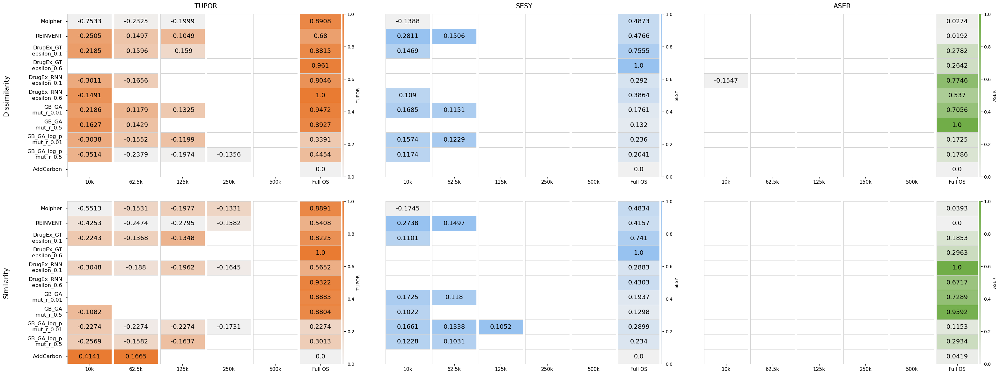

In [290]:
plot_heatmaps_diff_from_baseline_full(generators, subsets, receptors, scaffold, splits, save_name="all_subsets_diff_per_column",using_norm_values=True, data_folder=data_folder, save_folder = '../img') 

In [ ]:
def darken_hex_color(hex_color, factor=0.7):
    """Make the color darker while keeping the same hue."""
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16)
    g = int(hex_color[2:4], 16)
    b = int(hex_color[4:6], 16)
    r = int(r * factor)
    g = int(g * factor)
    b = int(b * factor)
    return f"#{r:02x}{g:02x}{b:02x}"

def saturate_hex_color(hex_color, sat_factor=1.4, val_factor=1.1):
    """Increase saturation (and optionally brightness) while keeping hue."""
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16) / 255
    g = int(hex_color[2:4], 16) / 255
    b = int(hex_color[4:6], 16) / 255

    h, s, v = colorsys.rgb_to_hsv(r, g, b)

    s = min(1.0, s * sat_factor)   # zvýší saturaci
    v = min(1.0, v * val_factor)   # trochu zvýší jas (volitelné)

    r2, g2, b2 = colorsys.hsv_to_rgb(h, s, v)
    return f"#{int(r2*255):02x}{int(g2*255):02x}{int(b2*255):02x}"

In [295]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import colorsys



def plot_combined_norm_and_diff_heatmaps(
        generators, subsets, receptor, scaffold, split,
        metrics=['TUPOR','SESY','ASER'],
        title=None, save_name = '', data_folder='', save_folder = '',
        inter_metric_wspace=0.25, intra_metric_wspace=0.15
    ):

    # --- BARVY ---
    metric_base_colors_norm = {'TUPOR': "#e97b32", 'SESY': "#97C2F0", 'ASER': "#71ad48"}
    metric_base_colors_diff = {
    'TUPOR': "#b2182b",  # deep red (positive side)
    'SESY':  "#2166ac",  # deep blue (negative side)
    'ASER':  "#f4a582"   # light warm (secondary highlight)
    }

    # --- SBĚR DAT ---
    data_norm = []
    data_diff = []
    baseline_values = {}

    baseline_sub = ""

    # --- baseline načtení ---
    if baseline_sub in subsets:
        gens_baseline = [f"{g}{baseline_sub}" for g in generators]
        df_base = hv.preprocesing(split, scaffold, gens_baseline, receptor, data_folder)

        for gen in generators:
            for metric in metrics:
                baseline_values[(gen, metric)] = df_base[df_base.name.str.startswith(gen)][metric].iloc[0]

    # --- načtení všech subsetů ---
    for sub in subsets:
        gens_now = [f"{g}{sub}" for g in generators]
        df_now = hv.preprocesing(split, scaffold, gens_now, receptor, data_folder)

        for gen in generators:
            for metric in metrics:
                val = df_now[df_now.name.str.startswith(gen)][metric].iloc[0]
                data_norm.append([gen, sub, metric, val])

                # rozdíl
                if sub == baseline_sub:
                    diff = 0.0
                else:
                    diff = val - baseline_values.get((gen, metric), np.nan)
                    if abs(diff) < 0.1:
                        diff = 0.0

                data_diff.append([gen, sub, metric, diff])

    df_norm = pd.DataFrame(data_norm, columns=['Generator','Subset','Metric','Value'])
    df_diff = pd.DataFrame(data_diff, columns=['Generator','Subset','Metric','Value'])

    # --- VYKRESLENÍ ---
    nmetrics = len(metrics)
    nsubsets = len(subsets)
    ngens = len(generators)

    fig = plt.figure(figsize=(2 + 1.6*nsubsets*nmetrics, 2 + 0.5*ngens*2))
    outer = fig.add_gridspec(nrows=2, ncols=nmetrics, wspace=inter_metric_wspace, hspace=0.15)

    # --- krásné jméno subsetu ---
    def pretty_subset(s):
        return "Full OS" if s in ("","_","None") else s.lstrip('_')

    # --- 1) NORMALIZOVANÉ ---
    for m_idx, metric in enumerate(metrics):
        block = df_norm[df_norm['Metric']==metric]
        inner = outer[0, m_idx].subgridspec(nrows=1, ncols=nsubsets, wspace=intra_metric_wspace)

        for s_idx, subset in enumerate(subsets):
            ax = fig.add_subplot(inner[0, s_idx])

            sub_b = block[block['Subset']==subset].set_index('Generator').reindex(generators)
            heat_vals = sub_b['Value'].to_numpy().reshape(ngens, 1)

            vmin, vmax = np.nanmin(heat_vals), np.nanmax(heat_vals)

            max_idx = np.argmax(heat_vals)

            annot_array = []

            for i, val in enumerate(heat_vals):
                # formátování podle using_norm_values
                text = f"{val[0]:.3f}"
                
                # tučně max
                if i == max_idx:
                    text = r"$\bf{" + text + "}$"
                
                annot_array.append(text)
            
            # reshape zpět do tvaru heatmapy
            annot = np.array(annot_array).reshape(heat_vals.shape)

            cmap_c = hv.make_cmap_to_white(metric_base_colors_norm[metric])

            show_cbar = (s_idx == nsubsets - 1)
            cax = None
            if show_cbar:
                div = make_axes_locatable(ax)
                cax = div.append_axes("right", size="4%", pad=0.04)

            sns.heatmap(
                heat_vals, ax=ax, cmap=cmap_c,
                annot=annot, fmt="",
                cbar=show_cbar, cbar_ax=cax,
                vmin=vmin, vmax=vmax,
                annot_kws={'color':'black','size':12},
                linewidths=0.5, linecolor="lightgrey"
            )

            ax.set_xticks([0.5])
            ax.set_xticklabels([pretty_subset(subset)], fontsize=11)

            show_yticks = (m_idx == 0 and s_idx == 0)
            if show_yticks:
                ax.set_yticks(np.arange(len(generators)) + 0.5)
                new_labels = [g.replace('_epsilon', '\n epsilon')
                              .replace('_mut_r', '\n mut_r')
                              .replace('addcarbon', 'AddCarbon')
                              for g in generators]
                ax.set_yticklabels(new_labels, rotation=0, fontsize=12)
                ax.tick_params(axis='y', pad=8)
                ax.set_ylabel("Normalized", fontsize=14)
            else:
                ax.set_yticks([])
                ax.set_yticklabels([])
                ax.set_ylabel("")
    # --- 2) DIFF ---
    for m_idx, metric in enumerate(metrics):
        block = df_diff[df_diff['Metric']==metric]
        inner = outer[1, m_idx].subgridspec(nrows=1, ncols=nsubsets, wspace=intra_metric_wspace)

        for s_idx, subset in enumerate(subsets):
            ax = fig.add_subplot(inner[0, s_idx])

            sub_b = block[block['Subset']==subset].set_index('Generator').reindex(generators)
            heat_vals = sub_b['Value'].to_numpy().reshape(ngens, 1)

            max_abs = np.max(np.abs(heat_vals))
            vmin, vmax = -max_abs, max_abs
            
            mask = (heat_vals==0) | np.isnan(heat_vals)
            annot = np.where(mask, "", np.round(heat_vals,4))

            cmap_c = hv.make_cmap_to_white(metric_base_colors_diff[metric])

            show_cbar = (s_idx == nsubsets - 1)
            cax = None
            if show_cbar:
                div = make_axes_locatable(ax)
                cax = div.append_axes("right", size="4%", pad=0.04)

            sns.heatmap(
                heat_vals, ax=ax,
                cmap='coolwarm', 
                mask=mask,
                annot=annot, fmt="",
                cbar=show_cbar, cbar_ax=cax,
                vmin=vmin, vmax=vmax,
                annot_kws={'color':'black','size':12},
                linewidths=0.5, linecolor="lightgrey"
            )

            ax.set_xticks([0.5])
            ax.set_xticklabels([pretty_subset(subset)], fontsize=11)

            show_yticks = (m_idx == 0 and s_idx == 0)
            if show_yticks:
                ax.set_yticks(np.arange(len(generators)) + 0.5)
                new_labels = [g.replace('_epsilon', '\n epsilon')
                              .replace('_mut_r', '\n mut_r')
                              .replace('addcarbon', 'AddCarbon')
                              for g in generators]
                ax.set_yticklabels(new_labels, rotation=0, fontsize=12)
                ax.tick_params(axis='y', pad=8)
                ax.set_ylabel("Diff", fontsize=14)
            else:
                ax.set_yticks([])
                ax.set_yticklabels([])
                ax.set_ylabel("")

    # --- názvy metrik ---
    for m_idx, metric in enumerate(metrics):
        pos = outer[0,m_idx].get_position(fig)
        fig.text((pos.x0+pos.x1)/2, pos.y1+0.02, metric, ha="center", fontsize=15)

    if title:
        fig.suptitle(title, fontsize=16)

    if save_name:
        if save_folder:
            plt.savefig(f'{save_folder}/{receptor}/{save_name}.svg', format="svg", bbox_inches='tight')
            plt.savefig(f'{save_folder}/{receptor}/{save_name}.png', format="png",dpi=300, bbox_inches='tight')
            plt.savefig(f'{save_folder}/{receptor}/{save_name}.png', format="tiff",dpi=300, bbox_inches='tight')
        else:
            plt.savefig(f'img/heat_map/{save_name}.svg', format="svg", bbox_inches='tight')
            plt.savefig(f'img/heat_map/{save_name}.png', format="png", dpi=300, bbox_inches='tight')
            plt.savefig(f'img/heat_map/{save_name}.tiff', format="tiff", dpi=300, bbox_inches='tight')
    plt.show()
    

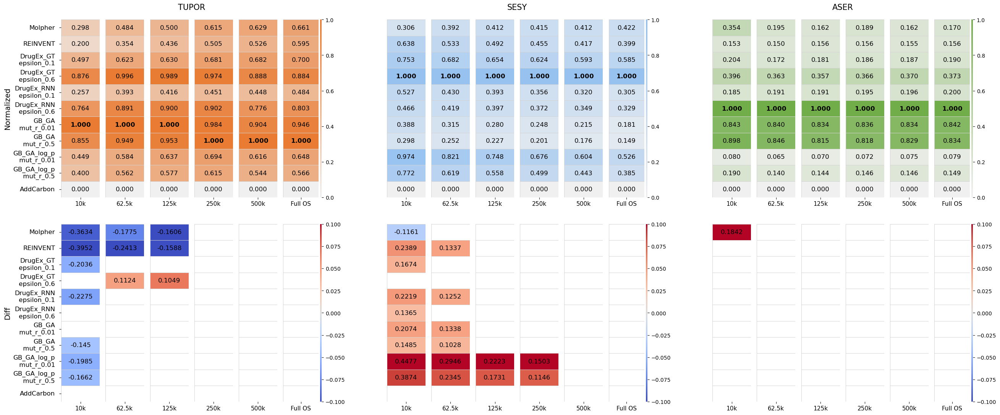

In [299]:
plot_combined_norm_and_diff_heatmaps(generators, subsets, receptor = 'Glucocorticoid_receptor', scaffold = 'csk', split = 'dis', save_name="all_subsets_with_diff_dis", data_folder=data_folder, save_folder = f'../img') 

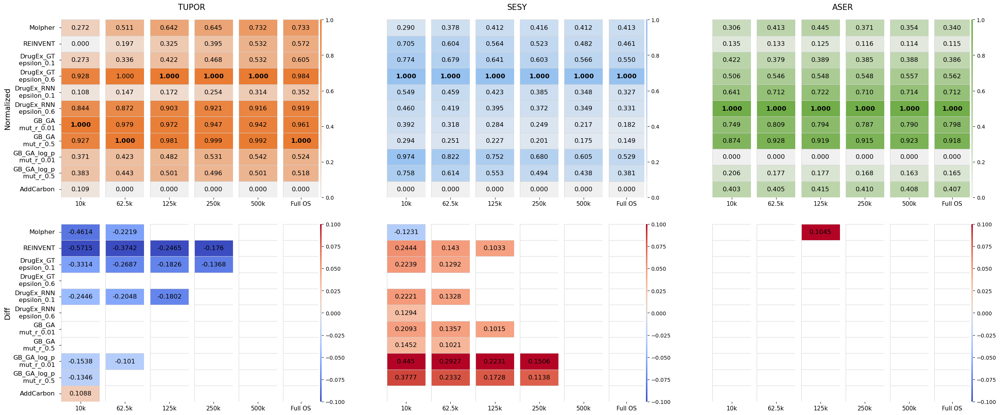

In [300]:
plot_combined_norm_and_diff_heatmaps(generators, subsets, receptor = 'Glucocorticoid_receptor', scaffold = 'csk', split = 'sim', save_name="all_subsets_with_diff_sim", data_folder=data_folder, save_folder = f'../img') 